In [1]:
!pip install gtts pyttsx3 soundfile numpy librosa ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.7 MB/s eta 0:00:00


In [2]:
!apt-get install espeak

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  espeak-data libespeak1 libportaudio2 libsonic0
The following NEW packages will be installed:
  espeak espeak-data libespeak1 libportaudio2 libsonic0
0 upgraded, 5 newly installed, 0 to remove and 30 not upgraded.
Need to get 1,382 kB of archives.
After this operation, 3,178 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudio2 amd64 19.6.0-1.1 [65.3 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libsonic0 amd64 0.2.0-11build1 [10.3 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 espeak-data amd64 1.48.15+dfsg-3 [1,085 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libespeak1 amd64 1.48.15+dfsg-3 [156 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/universe amd64 espeak amd64 1.48.15+dfsg-3 [64.2 kB]
Fetched 1,382 kB in 2s (575 kB

In [3]:
!pip install gtts pyttsx3 soundfile numpy librosa ipywidgets scipy

In [7]:
import os
import tempfile
import shutil
from gtts import gTTS
import soundfile as sf
import numpy as np
import librosa
import IPython.display as ipd
from google.colab import files
import ipywidgets as widgets
from IPython.display import display, HTML
from scipy import signal

# Install required packages (uncomment if needed)
# !pip install gtts soundfile numpy librosa ipywidgets scipy

def google_tts(text, output_path, rate=1.0):
    """
    Convert text to speech using Google's TTS service with US accent
    """
    tts = gTTS(text=text, lang='en', tld='com')  # 'com' TLD for US accent
    tts.save(output_path)

    # Speed adjustment if needed
    if rate != 1.0:
        # Load the audio file
        y, sr = librosa.load(output_path, sr=None)

        # Time stretch
        y_stretched = librosa.effects.time_stretch(y=y, rate=rate)

        # Save the modified audio
        sf.write(output_path, y_stretched, sr)

    return output_path

def enhance_audio(input_path, output_path):
    """
    Enhance audio quality with basic normalization and filtering
    """
    # Load audio
    y, sr = librosa.load(input_path, sr=None)

    # Normalize audio
    y_norm = librosa.util.normalize(y)

    # Basic noise reduction using scipy's high-pass filter
    nyquist = 0.5 * sr
    cutoff = 100 / nyquist
    b, a = signal.butter(4, cutoff, btype='highpass')

    # Apply filter
    y_filtered = signal.filtfilt(b, a, y_norm)

    # Save enhanced audio
    sf.write(output_path, y_filtered, sr)

    return output_path

def create_tts_form():
    """
    Create a form using ipywidgets for Colab (Google TTS only version)
    """
    text_area = widgets.Textarea(
        value='',
        placeholder='Paste your text here...',
        description='',
        disabled=False,
        layout=widgets.Layout(width='100%', height='200px')
    )

    rate_slider = widgets.FloatSlider(
        value=1.0,
        min=0.5,
        max=2.0,
        step=0.1,
        description='Speech Rate:',
        disabled=False,
        continuous_update=False,
    )

    enhance_checkbox = widgets.Checkbox(
        value=False,
        description='Enhance Audio',
        disabled=False
    )

    output_filename = widgets.Text(
        value='my_speech.mp3',
        placeholder='filename.mp3',
        description='Filename:',
        disabled=False
    )

    accent_dropdown = widgets.Dropdown(
        options=[
            ('US', 'com'),
            ('UK', 'co.uk'),
            ('Australia', 'com.au'),
            ('India', 'co.in'),
            ('Canada', 'ca')
        ],
        value='com',
        description='Accent:',
        disabled=False,
    )

    display(widgets.HTML(value="<h3>Text to Speech Converter (Google TTS)</h3><p>Paste your text below:</p>"))
    display(text_area)
    display(widgets.HBox([accent_dropdown, rate_slider]))
    display(widgets.HBox([enhance_checkbox, output_filename]))

    button = widgets.Button(description="Convert to Speech")
    output = widgets.Output()
    display(button, output)

    # Store form data
    form_data = {
        'text': '',
        'rate': 1.0,
        'enhance': False,
        'filename': 'my_speech.mp3',
        'tld': 'com'
    }

    def on_button_clicked(b):
        """Handle button click event"""
        form_data['text'] = text_area.value
        form_data['rate'] = rate_slider.value
        form_data['enhance'] = enhance_checkbox.value
        form_data['filename'] = output_filename.value
        form_data['tld'] = accent_dropdown.value

        with output:
            print("Converting text to speech...")

            try:
                convert_text_google(
                    form_data['text'],
                    form_data['rate'],
                    form_data['enhance'],
                    form_data['filename'],
                    form_data['tld']
                )
            except Exception as e:
                print(f"Error during conversion: {str(e)}")
                print("Try installing all required packages with:")
                print("!pip install gtts soundfile numpy librosa ipywidgets scipy")

    button.on_click(on_button_clicked)

def convert_text_google(text, rate, enhance, filename, tld='com'):
    """
    Convert text to speech with Google TTS
    """
    if not text.strip():
        print("No text provided! Please enter some text to convert.")
        return

    # Create temp directory
    with tempfile.TemporaryDirectory() as tmpdirname:
        temp_path = os.path.join(tmpdirname, "temp_audio.mp3")
        final_path = os.path.join(tmpdirname, "final_audio.mp3")

        # Generate speech with Google TTS
        print(f"Converting text using Google TTS with {tld} accent...")
        tts = gTTS(text=text, lang='en', tld=tld)
        tts.save(temp_path)

        # Apply speed adjustment if needed
        if rate != 1.0:
            print(f"Adjusting speech rate to {rate}x...")
            # Load the audio file
            y, sr = librosa.load(temp_path, sr=None)

            # Time stretch
            y_stretched = librosa.effects.time_stretch(y=y, rate=rate)

            # Save the modified audio
            sf.write(temp_path, y_stretched, sr)

        # Enhance if requested
        if enhance:
            print("Enhancing audio quality...")
            enhance_audio(temp_path, final_path)
        else:
            # Copy the file if not enhancing
            shutil.copy2(temp_path, final_path)

        # Play audio in the notebook
        print("Audio generation complete! Playing audio preview:")
        display(ipd.Audio(final_path, autoplay=False))

        # Download option
        print(f"Downloading audio file as {filename}...")

        # Save with the requested filename
        output_path = os.path.join(tmpdirname, filename)
        shutil.copy2(final_path, output_path)

        try:
            files.download(output_path)
        except Exception as e:
            print(f"Download error: {str(e)}")
            print("If the download doesn't start automatically, you can play the audio above.")

# Install dependencies check
print("Text to Speech Converter (Google TTS)")
print("-----------------------------------------")
print("Checking dependencies...")

try:
    # Import check
    from gtts import gTTS
    from IPython.display import display

    print("Creating text-to-speech interface...")
    create_tts_form()

except ImportError:
    print("Missing dependencies. Please run the following command first:")
    print("!pip install gtts soundfile numpy librosa ipywidgets scipy")

Text to Speech Converter (Google TTS)
-----------------------------------------
Checking dependencies...
Creating text-to-speech interface...


HTML(value='<h3>Text to Speech Converter (Google TTS)</h3><p>Paste your text below:</p>')

Textarea(value='', layout=Layout(height='200px', width='100%'), placeholder='Paste your text here...')

Button(description='Convert to Speech', style=ButtonStyle())

Output()

Pretend to be a good presenter and storyteller. Then create only a narrator voice script for a YouTube Shorts video about this topic"". Use a hook in the first 3 seconds. I want the script to be 50 seconds long. At the end, say something interesting to encourage viewers to subscribe to our channel and support us.(please don't incldue any imojie or other things thought sctrip just create paragraph without  breakes)

# voice to video

# voice to video only animations

Setting up Lip Sync Animation Generator...
This will create a feminine cartoon character with lip sync based on your voice input
----------------------------------------------------------------------


FileUpload(value={}, accept='audio/*', description='Upload Audio')

Button(button_style='success', description='Generate Animation', icon='film', style=ButtonStyle(), tooltip='Cl…

Output()

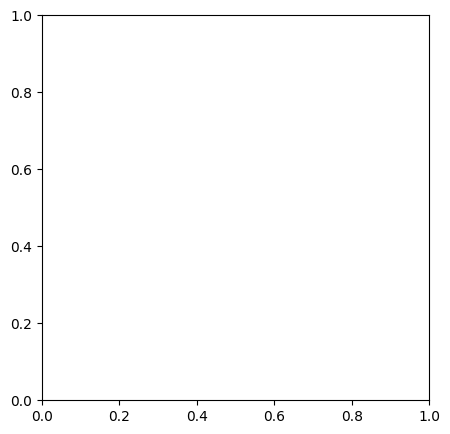

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Circle, Ellipse, Rectangle, Arc
from google.colab import files
import librosa
import soundfile as sf
import IPython.display as ipd
import os
import tempfile
import time
import cv2
from moviepy.editor import ImageSequenceClip, AudioFileClip
import ipywidgets as widgets
from IPython.display import display, HTML, clear_output
import base64
from tqdm.notebook import tqdm
import io
import subprocess

# Install required packages
try:
    # Check if packages are installed
    import moviepy
    import librosa
except ImportError:
    print("Installing required packages...")
    !pip install moviepy librosa matplotlib ipywidgets tqdm opencv-python

class LipSyncAnimator:
    def __init__(self):
        self.fig, self.ax = plt.subplots(figsize=(5, 5))
        self.audio_features = None
        self.frames = []
        self.face_color = "#FFD39B"  # Default skin tone
        self.eye_color = "#1E90FF"   # Default eye color
        self.mouth_color = "#FF6B6B" # Default lip color
        self.emotion = "neutral"     # Default emotion
        self.gender = "female"       # Set default gender to female

    def analyze_audio(self, audio_path):
        """Extract audio features for lip sync"""
        y, sr = librosa.load(audio_path, sr=None)

        # Extract volume (amplitude envelope)
        hop_length = 512
        n_fft = 2048

        # Get amplitude envelope
        amplitude_envelope = np.array([
            max(abs(y[i:i+hop_length]))
            for i in range(0, len(y), hop_length)
        ])

        # Get spectral centroid for additional expression cues
        spectral_centroids = librosa.feature.spectral_centroid(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]

        # Get MFCCs for additional features
        mfccs = librosa.feature.mfcc(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)

        # Normalize all features
        amplitude_envelope = (amplitude_envelope - amplitude_envelope.min()) / (amplitude_envelope.max() - amplitude_envelope.min())
        spectral_centroids = (spectral_centroids - spectral_centroids.min()) / (spectral_centroids.max() - spectral_centroids.min())

        # Combine features
        self.audio_features = {
            'amplitude': amplitude_envelope,
            'spectral_centroids': spectral_centroids,
            'mfccs': mfccs,
            'sr': sr,
            'hop_length': hop_length,
            'duration': len(y) / sr,
            'frames_needed': len(amplitude_envelope)
        }

        return self.audio_features

    def draw_face(self, mouth_openness, blink, emotion_intensity):
        """Draw a cartoon face with expressions"""
        self.ax.clear()

        # Set up drawing area
        self.ax.set_xlim(-5, 5)
        self.ax.set_ylim(-5, 5)
        self.ax.axis('off')

        # Draw head - make slightly more oval for feminine look
        head = Ellipse((0, 0), width=7.5, height=9, color=self.face_color, ec='black', lw=1.5)
        self.ax.add_patch(head)

        # Draw hair for feminine face
        self.draw_hair()

        # Select emotion expressions
        if self.emotion == "happy":
            # Happy: curved smile, raised eyebrows
            eyebrow_height = 2 + 0.5 * emotion_intensity
            mouth_curve = 0.5 + 0.5 * emotion_intensity
        elif self.emotion == "sad":
            # Sad: downturned mouth, lowered eyebrows
            eyebrow_height = 1.5 - 0.5 * emotion_intensity
            mouth_curve = -0.5 * emotion_intensity
        elif self.emotion == "angry":
            # Angry: \/ eyebrows, tight mouth
            eyebrow_height = 1.5
            mouth_curve = -0.2 * emotion_intensity
        elif self.emotion == "surprised":
            # Surprised: raised eyebrows, O mouth
            eyebrow_height = 2 + emotion_intensity
            mouth_curve = 0
        else:  # neutral
            eyebrow_height = 1.8
            mouth_curve = 0

        # Draw eyes (accounting for blinking) - make larger and more feminine
        if blink < 0.3:  # Eyes closed when blink value is low
            left_eye = Ellipse((-1.5, 1), width=1.4, height=0.1, angle=0, color='black')
            right_eye = Ellipse((1.5, 1), width=1.4, height=0.1, angle=0, color='black')
            self.ax.add_patch(left_eye)
            self.ax.add_patch(right_eye)
        else:
            # First draw white backgrounds - less angled for better pupil visibility
            left_eye_white = Ellipse((-1.5, 1), width=1.4, height=1.0, angle=10, color='white', ec='black', lw=1)
            right_eye_white = Ellipse((1.5, 1), width=1.4, height=1.0, angle=-10, color='white', ec='black', lw=1)
            self.ax.add_patch(left_eye_white)
            self.ax.add_patch(right_eye_white)

            # Draw pupils - made larger and ensure they're drawn AFTER the white eye backgrounds
            left_pupil = Circle((-1.5, 1), radius=0.4, color=self.eye_color, zorder=10)
            right_pupil = Circle((1.5, 1), radius=0.4, color=self.eye_color, zorder=10)

            # Add black centers to pupils
            left_pupil_center = Circle((-1.5, 1), radius=0.2, color='black', zorder=11)
            right_pupil_center = Circle((1.5, 1), radius=0.2, color='black', zorder=11)

            self.ax.add_patch(left_pupil)
            self.ax.add_patch(right_pupil)
            self.ax.add_patch(left_pupil_center)
            self.ax.add_patch(right_pupil_center)

            # Add highlight to eyes
            left_highlight = Circle((-1.65, 1.15), radius=0.15, color='white', zorder=12)
            right_highlight = Circle((1.35, 1.15), radius=0.15, color='white', zorder=12)
            self.ax.add_patch(left_highlight)
            self.ax.add_patch(right_highlight)

            # Draw eyelashes for feminine look
            self.draw_eyelashes()

        # Draw eyebrows - thinner and more arched for feminine look
        if self.emotion == "angry":
            # Angry eyebrows (angled inward)
            left_eyebrow = Rectangle((-2.1, eyebrow_height), width=1.2, height=0.2, angle=-30, color='black')
            right_eyebrow = Rectangle((0.9, eyebrow_height), width=1.2, height=0.2, angle=30, color='black')
        else:
            # Arched eyebrows for feminine look
            left_eyebrow = Arc((-1.5, eyebrow_height), width=1.6, height=0.8,
                              theta1=0, theta2=180, color='black', lw=2)
            right_eyebrow = Arc((1.5, eyebrow_height), width=1.6, height=0.8,
                               theta1=0, theta2=180, color='black', lw=2)

        self.ax.add_patch(left_eyebrow)
        self.ax.add_patch(right_eyebrow)

        # Draw nose - smaller and more delicate for feminine look
        nose = Arc((0, 0), width=0.6, height=1.2, theta1=0, theta2=180, color='black', lw=1.2)
        self.ax.add_patch(nose)

        # Draw mouth based on audio amplitude (mouth_openness) - fuller lips
        if self.emotion == "surprised":
            # Surprised = O shaped mouth
            mouth_width = 2 + mouth_openness * 0.5
            mouth_height = 1 + mouth_openness * 2
            # Fuller lips
            outer_mouth = Ellipse((0, -1.5), width=mouth_width, height=mouth_height, color=self.mouth_color, ec='black', lw=1)
            self.ax.add_patch(outer_mouth)

            # Inner mouth
            if mouth_height > 0.5:
                inner_mouth = Ellipse((0, -1.5), width=mouth_width*0.8, height=mouth_height*0.8, color='black', alpha=0.8)
                self.ax.add_patch(inner_mouth)
        else:
            # Other emotions use varying curves
            mouth_width = 2.5 + mouth_openness * 0.5
            mouth_height = 0.2 + mouth_openness * 2

            # Fuller lips for feminine look
            upper_lip_height = 0.4 + mouth_openness * 0.3
            lower_lip_height = 0.5 + mouth_openness * 0.7

            # Draw upper lip with fuller shape
            upper_lip = Arc((0, -1.5 + mouth_curve), width=mouth_width, height=upper_lip_height * 2,
                          theta1=180, theta2=0, color=self.mouth_color, lw=2)

            # Draw fuller lower lip
            lower_lip = Arc((0, -1.5 + mouth_curve - upper_lip_height/2), width=mouth_width,
                           height=lower_lip_height * 2, theta1=0, theta2=180, color=self.mouth_color, lw=2.5)

            self.ax.add_patch(upper_lip)
            self.ax.add_patch(lower_lip)

            # If mouth is open enough, draw inside of mouth
            if mouth_height > 0.5:
                mouth_inside = Ellipse((0, -1.5 + mouth_curve), width=mouth_width*0.75,
                                     height=mouth_height*0.8, color='black', alpha=0.8)
                self.ax.add_patch(mouth_inside)

        # Add blush for feminine look
        self.draw_blush(emotion_intensity)

    def draw_hair(self):
        """Draw feminine hair style"""
        # Hair color - slightly darker than face color
        hair_color = '#8B4513'  # Brown hair

        # Draw hair outline
        hair_top = Ellipse((0, 3), width=9, height=4, color=hair_color)
        self.ax.add_patch(hair_top)

        # Side hair
        left_hair = Ellipse((-3.75, 0), width=2, height=8, angle=10, color=hair_color)
        right_hair = Ellipse((3.75, 0), width=2, height=8, angle=-10, color=hair_color)
        self.ax.add_patch(left_hair)
        self.ax.add_patch(right_hair)

        # Hair bangs
        bangs = Arc((0, 2), width=6, height=2, theta1=210, theta2=330, color=hair_color, lw=3)
        self.ax.add_patch(bangs)

    def draw_eyelashes(self):
        """Draw feminine eyelashes"""
        # Define eyelash positions
        left_lash_positions = [
            (-2.2, 1.2, 135), (-1.9, 1.5, 90), (-1.5, 1.6, 75), (-1.1, 1.5, 60), (-0.8, 1.2, 45)
        ]

        right_lash_positions = [
            (2.2, 1.2, 45), (1.9, 1.5, 90), (1.5, 1.6, 105), (1.1, 1.5, 120), (0.8, 1.2, 135)
        ]

        # Draw eyelashes
        for x, y, angle in left_lash_positions:
            dx = 0.4 * np.cos(np.radians(angle))
            dy = 0.4 * np.sin(np.radians(angle))
            self.ax.plot([x, x + dx], [y, y + dy], color='black', lw=1.5)

        for x, y, angle in right_lash_positions:
            dx = 0.4 * np.cos(np.radians(angle))
            dy = 0.4 * np.sin(np.radians(angle))
            self.ax.plot([x, x + dx], [y, y + dy], color='black', lw=1.5)

    def draw_blush(self, intensity):
        """Draw blush on cheeks"""
        # Only draw blush for happy or neutral emotions
        if self.emotion in ["happy", "neutral"]:
            blush_color = '#FF9999'
            blush_alpha = 0.3 + intensity * 0.2

            left_blush = Ellipse((-2.5, -0.5), width=1.8, height=1.2, angle=0,
                               color=blush_color, alpha=blush_alpha)
            right_blush = Ellipse((2.5, -0.5), width=1.8, height=1.2, angle=0,
                                color=blush_color, alpha=blush_alpha)

            self.ax.add_patch(left_blush)
            self.ax.add_patch(right_blush)

    def generate_animation(self, audio_path, fps=24, emotion="neutral", face_color="#FFD39B",
                          eye_color="#1E90FF", mouth_color="#FF6B6B"):
        """Generate full animation based on audio"""
        # Set style parameters
        self.emotion = emotion
        self.face_color = face_color
        self.eye_color = eye_color
        self.mouth_color = mouth_color

        # Extract audio features
        features = self.analyze_audio(audio_path)

        # Calculate frame count and duration
        total_frames = int(features['duration'] * fps)

        # Prepare frames list
        self.frames = []

        # Generate frames
        print("Generating animation frames...")

        # Convert audio feature indices to frame indices
        amplitude_envelope = features['amplitude']
        spectral_centroids = features['spectral_centroids']

        # Create frames
        for i in tqdm(range(total_frames)):
            # Map current frame to audio feature index
            audio_idx = int((i / total_frames) * len(amplitude_envelope))

            # Extract features for this frame
            if audio_idx < len(amplitude_envelope):
                mouth_openness = amplitude_envelope[audio_idx] * 1.5  # Scale for better visibility
                spectral = spectral_centroids[audio_idx]
            else:
                mouth_openness = 0
                spectral = 0.5

            # Create random blink pattern (more likely when spectral centroid is low)
            blink_chance = np.random.rand()
            blink = 0.2 if (blink_chance > 0.95) else 1.0

            # Use spectral centroid for expression intensity
            emotion_intensity = spectral * 0.8 + 0.2

            # Draw the face
            self.draw_face(mouth_openness, blink, emotion_intensity)

            # Save the frame
            self.fig.canvas.draw()
            frame = np.array(self.fig.canvas.renderer.buffer_rgba())
            self.frames.append(frame)

            # Clear for next iteration
            plt.close()
            self.fig, self.ax = plt.subplots(figsize=(5, 5))

        print(f"Generated {len(self.frames)} frames")
        return self.frames

    def create_video(self, audio_path, frames, output_path, fps=24):
        """Create video from frames and audio"""
        # Create video from frames
        clip = ImageSequenceClip(frames, fps=fps)

        # Add audio
        audio_clip = AudioFileClip(audio_path)
        video_with_audio = clip.set_audio(audio_clip)

        # Write video file
        video_with_audio.write_videofile(output_path, codec='libx264', audio_codec='aac')

        return output_path

def upload_audio_widget():
    """Create widget for audio upload"""
    upload_button = widgets.FileUpload(
        accept='audio/*',
        multiple=False,
        description='Upload Audio'
    )

    display(HTML("<h3>Upload an audio file for lip sync animation</h3>"))
    display(upload_button)

    return upload_button

def create_animation_form():
    """Create form for animation settings"""
    emotions = ['neutral', 'happy', 'sad', 'angry', 'surprised']

    emotion_dropdown = widgets.Dropdown(
        options=emotions,
        value='neutral',
        description='Emotion:',
        disabled=False,
    )

    face_color = widgets.ColorPicker(
        concise=False,
        description='Skin Color:',
        value='#FFD39B',
        disabled=False
    )

    eye_color = widgets.ColorPicker(
        concise=False,
        description='Eye Color:',
        value='#1E90FF',
        disabled=False
    )

    mouth_color = widgets.ColorPicker(
        concise=False,
        description='Lip Color:',
        value='#FF6B6B',
        disabled=False
    )

    fps_slider = widgets.IntSlider(
        value=15,
        min=10,
        max=30,
        step=1,
        description='FPS:',
        disabled=False,
        continuous_update=False
    )

    filename = widgets.Text(
        value='lip_sync_animation.mp4',
        placeholder='filename.mp4',
        description='Output File:',
        disabled=False
    )

    display(HTML("<h3>Animation Settings</h3>"))
    display(widgets.VBox([
        emotion_dropdown,
        widgets.HBox([face_color, eye_color, mouth_color]),
        widgets.HBox([fps_slider, filename])
    ]))

    settings = {
        'emotion': emotion_dropdown,
        'face_color': face_color,
        'eye_color': eye_color,
        'mouth_color': mouth_color,
        'fps': fps_slider,
        'filename': filename
    }

    return settings

def main():
    """Main function to run the application"""
    print("Setting up Lip Sync Animation Generator...")
    print("This will create a feminine cartoon character with lip sync based on your voice input")
    print("-" * 70)

    # Create upload widget
    upload_button = upload_audio_widget()

    # Create settings form
    settings = create_animation_form()

    # Create generate button
    generate_button = widgets.Button(
        description='Generate Animation',
        disabled=False,
        button_style='success',
        tooltip='Click to generate animation',
        icon='film'
    )

    output_area = widgets.Output()
    display(generate_button, output_area)

    def on_generate_clicked(b):
        """Handle generate button click"""
        with output_area:
            clear_output()

            # Check if file was uploaded
            if not upload_button.value:
                print("Please upload an audio file first!")
                return

            # Get uploaded file
            file_info = next(iter(upload_button.value.items()))
            filename, content = file_info

            print(f"Processing audio file: {filename}")

            # Save audio to temp file
            with tempfile.NamedTemporaryFile(suffix='.wav', delete=False) as temp_audio:
                temp_audio_path = temp_audio.name
                temp_audio.write(content['content'])

            # Create output path
            output_filename = settings['filename'].value
            output_path = f"/content/{output_filename}"

            # Create animator
            animator = LipSyncAnimator()

            # Generate animation
            try:
                frames = animator.generate_animation(
                    temp_audio_path,
                    fps=settings['fps'].value,
                    emotion=settings['emotion'].value,
                    face_color=settings['face_color'].value,
                    eye_color=settings['eye_color'].value,
                    mouth_color=settings['mouth_color'].value
                )

                print("Creating video with audio...")
                video_path = animator.create_video(
                    temp_audio_path,
                    frames,
                    output_path,
                    fps=settings['fps'].value
                )

                print(f"Animation complete! File saved as: {output_path}")

                # Display video preview
                print("Video preview:")
                video_html = f"""
                <video width="400" height="400" controls>
                    <source src="data:video/mp4;base64,{base64.b64encode(open(output_path, 'rb').read()).decode()}" type="video/mp4">
                    Your browser does not support the video tag.
                </video>
                """
                display(HTML(video_html))

                # Download option
                print("Downloading animation...")
                files.download(output_path)

            except Exception as e:
                print(f"Error generating animation: {str(e)}")
                import traceback
                traceback.print_exc()

    generate_button.on_click(on_generate_clicked)

# Run the application
main()

[100 scripts](https://chatgpt.com/share/67f95a46-11ac-8008-98dd-49cff17b1687)

# full code

Text to Animation with Canadian Accent
-------------------------------------
This app converts your text to speech with a Canadian accent
and creates a female cartoon character that lip-syncs to your speech.


Textarea(value='', layout=Layout(height='150px', width='100%'), placeholder='Enter your text here...')

Button(button_style='success', description='Generate Animation', icon='film', style=ButtonStyle(), tooltip='Cl…

Output()

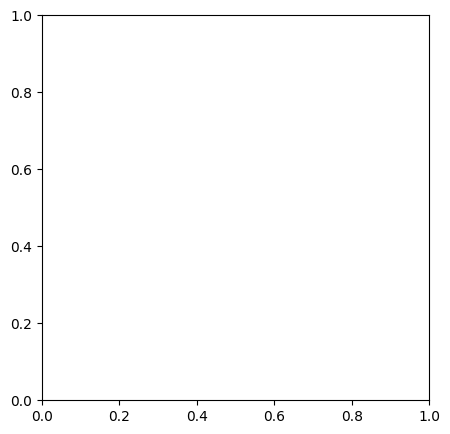

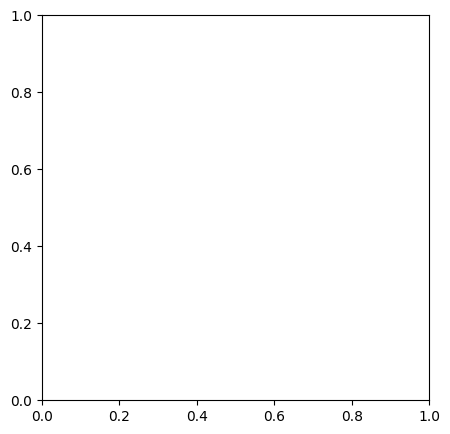

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Circle, Ellipse, Rectangle, Arc
from google.colab import files
import librosa
import soundfile as sf
import IPython.display as ipd
import os
import tempfile
import time
import cv2
from moviepy.editor import ImageSequenceClip, AudioFileClip
import ipywidgets as widgets
from IPython.display import display, HTML, clear_output
import base64
from tqdm.notebook import tqdm
import io
import subprocess
import shutil
from gtts import gTTS
from scipy import signal

# Install required packages
try:
    # Check if packages are installed
    import moviepy
    import librosa
    from gtts import gTTS
except ImportError:
    print("Installing required packages...")
    !pip install moviepy librosa matplotlib ipywidgets tqdm opencv-python gtts soundfile scipy

class TextToSpeech:
    def __init__(self):
        """Initialize the text to speech converter"""
        pass

    def convert_text(self, text, output_path, rate=1.0, tld='ca', enhance=True):
        """
        Convert text to speech using Google's TTS with specified accent
        tld='ca' for Canadian accent
        """
        if not text.strip():
            raise ValueError("No text provided! Please enter some text to convert.")

        # Create temp directory
        with tempfile.TemporaryDirectory() as tmpdirname:
            temp_path = os.path.join(tmpdirname, "temp_audio.mp3")

            # Generate speech with Google TTS
            print(f"Converting text using Google TTS with Canadian accent...")
            tts = gTTS(text=text, lang='en', tld=tld)
            tts.save(temp_path)

            # Apply speed adjustment if needed
            if rate != 1.0:
                print(f"Adjusting speech rate to {rate}x...")
                # Load the audio file
                y, sr = librosa.load(temp_path, sr=None)

                # Time stretch
                y_stretched = librosa.effects.time_stretch(y=y, rate=rate)

                # Save the modified audio
                sf.write(temp_path, y_stretched, sr)

            # Enhance if requested
            if enhance:
                print("Enhancing audio quality...")
                self.enhance_audio(temp_path, output_path)
            else:
                # Copy the file if not enhancing
                shutil.copy2(temp_path, output_path)

            return output_path

    def enhance_audio(self, input_path, output_path):
        """
        Enhance audio quality with basic normalization and filtering
        """
        # Load audio
        y, sr = librosa.load(input_path, sr=None)

        # Normalize audio
        y_norm = librosa.util.normalize(y)

        # Basic noise reduction using scipy's high-pass filter
        nyquist = 0.5 * sr
        cutoff = 100 / nyquist
        b, a = signal.butter(4, cutoff, btype='highpass')

        # Apply filter
        y_filtered = signal.filtfilt(b, a, y_norm)

        # Save enhanced audio
        sf.write(output_path, y_filtered, sr)

        return output_path

class LipSyncAnimator:
    def __init__(self):
        self.fig, self.ax = plt.subplots(figsize=(5, 5))
        self.audio_features = None
        self.frames = []
        self.face_color = "#FFD39B"  # Default skin tone
        self.eye_color = "#1E90FF"   # Default eye color
        self.mouth_color = "#FF6B6B" # Default lip color
        self.emotion = "neutral"     # Default emotion
        self.gender = "female"       # Set default gender to female

    def analyze_audio(self, audio_path):
        """Extract audio features for lip sync"""
        y, sr = librosa.load(audio_path, sr=None)

        # Extract volume (amplitude envelope)
        hop_length = 512
        n_fft = 2048

        # Get amplitude envelope
        amplitude_envelope = np.array([
            max(abs(y[i:i+hop_length]))
            for i in range(0, len(y), hop_length)
        ])

        # Get spectral centroid for additional expression cues
        spectral_centroids = librosa.feature.spectral_centroid(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)[0]

        # Get MFCCs for additional features
        mfccs = librosa.feature.mfcc(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)

        # Normalize all features
        amplitude_envelope = (amplitude_envelope - amplitude_envelope.min()) / (amplitude_envelope.max() - amplitude_envelope.min())
        spectral_centroids = (spectral_centroids - spectral_centroids.min()) / (spectral_centroids.max() - spectral_centroids.min())

        # Combine features
        self.audio_features = {
            'amplitude': amplitude_envelope,
            'spectral_centroids': spectral_centroids,
            'mfccs': mfccs,
            'sr': sr,
            'hop_length': hop_length,
            'duration': len(y) / sr,
            'frames_needed': len(amplitude_envelope)
        }

        return self.audio_features

    def draw_face(self, mouth_openness, blink, emotion_intensity):
        """Draw a cartoon face with expressions"""
        self.ax.clear()

        # Set up drawing area
        self.ax.set_xlim(-5, 5)
        self.ax.set_ylim(-5, 5)
        self.ax.axis('off')

        # Draw head - make slightly more oval for feminine look
        head = Ellipse((0, 0), width=7.5, height=9, color=self.face_color, ec='black', lw=1.5)
        self.ax.add_patch(head)

        # Draw hair for feminine face
        self.draw_hair()

        # Select emotion expressions
        if self.emotion == "happy":
            # Happy: curved smile, raised eyebrows
            eyebrow_height = 2 + 0.5 * emotion_intensity
            mouth_curve = 0.5 + 0.5 * emotion_intensity
        elif self.emotion == "sad":
            # Sad: downturned mouth, lowered eyebrows
            eyebrow_height = 1.5 - 0.5 * emotion_intensity
            mouth_curve = -0.5 * emotion_intensity
        elif self.emotion == "angry":
            # Angry: \/ eyebrows, tight mouth
            eyebrow_height = 1.5
            mouth_curve = -0.2 * emotion_intensity
        elif self.emotion == "surprised":
            # Surprised: raised eyebrows, O mouth
            eyebrow_height = 2 + emotion_intensity
            mouth_curve = 0
        else:  # neutral
            eyebrow_height = 1.8
            mouth_curve = 0

        # Draw eyes (accounting for blinking) - make larger and more feminine
        if blink < 0.3:  # Eyes closed when blink value is low
            left_eye = Ellipse((-1.5, 1), width=1.4, height=0.1, angle=0, color='black')
            right_eye = Ellipse((1.5, 1), width=1.4, height=0.1, angle=0, color='black')
            self.ax.add_patch(left_eye)
            self.ax.add_patch(right_eye)
        else:
            # First draw white backgrounds - less angled for better pupil visibility
            left_eye_white = Ellipse((-1.5, 1), width=1.4, height=1.0, angle=10, color='white', ec='black', lw=1)
            right_eye_white = Ellipse((1.5, 1), width=1.4, height=1.0, angle=-10, color='white', ec='black', lw=1)
            self.ax.add_patch(left_eye_white)
            self.ax.add_patch(right_eye_white)

            # Draw pupils - made larger and ensure they're drawn AFTER the white eye backgrounds
            left_pupil = Circle((-1.5, 1), radius=0.4, color=self.eye_color, zorder=10)
            right_pupil = Circle((1.5, 1), radius=0.4, color=self.eye_color, zorder=10)

            # Add black centers to pupils
            left_pupil_center = Circle((-1.5, 1), radius=0.2, color='black', zorder=11)
            right_pupil_center = Circle((1.5, 1), radius=0.2, color='black', zorder=11)

            self.ax.add_patch(left_pupil)
            self.ax.add_patch(right_pupil)
            self.ax.add_patch(left_pupil_center)
            self.ax.add_patch(right_pupil_center)

            # Add highlight to eyes
            left_highlight = Circle((-1.65, 1.15), radius=0.15, color='white', zorder=12)
            right_highlight = Circle((1.35, 1.15), radius=0.15, color='white', zorder=12)
            self.ax.add_patch(left_highlight)
            self.ax.add_patch(right_highlight)

            # Draw eyelashes for feminine look
            self.draw_eyelashes()

        # Draw eyebrows - thinner and more arched for feminine look
        if self.emotion == "angry":
            # Angry eyebrows (angled inward)
            left_eyebrow = Rectangle((-2.1, eyebrow_height), width=1.2, height=0.2, angle=-30, color='black')
            right_eyebrow = Rectangle((0.9, eyebrow_height), width=1.2, height=0.2, angle=30, color='black')
        else:
            # Arched eyebrows for feminine look
            left_eyebrow = Arc((-1.5, eyebrow_height), width=1.6, height=0.8,
                              theta1=0, theta2=180, color='black', lw=2)
            right_eyebrow = Arc((1.5, eyebrow_height), width=1.6, height=0.8,
                               theta1=0, theta2=180, color='black', lw=2)

        self.ax.add_patch(left_eyebrow)
        self.ax.add_patch(right_eyebrow)

        # Draw nose - smaller and more delicate for feminine look
        nose = Arc((0, 0), width=0.6, height=1.2, theta1=0, theta2=180, color='black', lw=1.2)
        self.ax.add_patch(nose)

        # Draw mouth based on audio amplitude (mouth_openness) - fuller lips
        if self.emotion == "surprised":
            # Surprised = O shaped mouth
            mouth_width = 2 + mouth_openness * 0.5
            mouth_height = 1 + mouth_openness * 2
            # Fuller lips
            outer_mouth = Ellipse((0, -1.5), width=mouth_width, height=mouth_height, color=self.mouth_color, ec='black', lw=1)
            self.ax.add_patch(outer_mouth)

            # Inner mouth
            if mouth_height > 0.5:
                inner_mouth = Ellipse((0, -1.5), width=mouth_width*0.8, height=mouth_height*0.8, color='black', alpha=0.8)
                self.ax.add_patch(inner_mouth)
        else:
            # Other emotions use varying curves
            mouth_width = 2.5 + mouth_openness * 0.5
            mouth_height = 0.2 + mouth_openness * 2

            # Fuller lips for feminine look
            upper_lip_height = 0.4 + mouth_openness * 0.3
            lower_lip_height = 0.5 + mouth_openness * 0.7

            # Draw upper lip with fuller shape
            upper_lip = Arc((0, -1.5 + mouth_curve), width=mouth_width, height=upper_lip_height * 2,
                          theta1=180, theta2=0, color=self.mouth_color, lw=2)

            # Draw fuller lower lip
            lower_lip = Arc((0, -1.5 + mouth_curve - upper_lip_height/2), width=mouth_width,
                           height=lower_lip_height * 2, theta1=0, theta2=180, color=self.mouth_color, lw=2.5)

            self.ax.add_patch(upper_lip)
            self.ax.add_patch(lower_lip)

            # If mouth is open enough, draw inside of mouth
            if mouth_height > 0.5:
                mouth_inside = Ellipse((0, -1.5 + mouth_curve), width=mouth_width*0.75,
                                     height=mouth_height*0.8, color='black', alpha=0.8)
                self.ax.add_patch(mouth_inside)

        # Add blush for feminine look
        self.draw_blush(emotion_intensity)

    def draw_hair(self):
        """Draw feminine hair style"""
        # Hair color - slightly darker than face color
        hair_color = '#8B4513'  # Brown hair

        # Draw hair outline
        hair_top = Ellipse((0, 3), width=9, height=4, color=hair_color)
        self.ax.add_patch(hair_top)

        # Side hair
        left_hair = Ellipse((-3.75, 0), width=2, height=8, angle=10, color=hair_color)
        right_hair = Ellipse((3.75, 0), width=2, height=8, angle=-10, color=hair_color)
        self.ax.add_patch(left_hair)
        self.ax.add_patch(right_hair)

        # Hair bangs
        bangs = Arc((0, 2), width=6, height=2, theta1=210, theta2=330, color=hair_color, lw=3)
        self.ax.add_patch(bangs)

    def draw_eyelashes(self):
        """Draw feminine eyelashes"""
        # Define eyelash positions
        left_lash_positions = [
            (-2.2, 1.2, 135), (-1.9, 1.5, 90), (-1.5, 1.6, 75), (-1.1, 1.5, 60), (-0.8, 1.2, 45)
        ]

        right_lash_positions = [
            (2.2, 1.2, 45), (1.9, 1.5, 90), (1.5, 1.6, 105), (1.1, 1.5, 120), (0.8, 1.2, 135)
        ]

        # Draw eyelashes
        for x, y, angle in left_lash_positions:
            dx = 0.4 * np.cos(np.radians(angle))
            dy = 0.4 * np.sin(np.radians(angle))
            self.ax.plot([x, x + dx], [y, y + dy], color='black', lw=1.5)

        for x, y, angle in right_lash_positions:
            dx = 0.4 * np.cos(np.radians(angle))
            dy = 0.4 * np.sin(np.radians(angle))
            self.ax.plot([x, x + dx], [y, y + dy], color='black', lw=1.5)

    def draw_blush(self, intensity):
        """Draw blush on cheeks"""
        # Only draw blush for happy or neutral emotions
        if self.emotion in ["happy", "neutral"]:
            blush_color = '#FF9999'
            blush_alpha = 0.3 + intensity * 0.2

            left_blush = Ellipse((-2.5, -0.5), width=1.8, height=1.2, angle=0,
                               color=blush_color, alpha=blush_alpha)
            right_blush = Ellipse((2.5, -0.5), width=1.8, height=1.2, angle=0,
                                color=blush_color, alpha=blush_alpha)

            self.ax.add_patch(left_blush)
            self.ax.add_patch(right_blush)

    def generate_animation(self, audio_path, fps=24, emotion="neutral", face_color="#FFD39B",
                          eye_color="#1E90FF", mouth_color="#FF6B6B"):
        """Generate full animation based on audio"""
        # Set style parameters
        self.emotion = emotion
        self.face_color = face_color
        self.eye_color = eye_color
        self.mouth_color = mouth_color

        # Extract audio features
        features = self.analyze_audio(audio_path)

        # Calculate frame count and duration
        total_frames = int(features['duration'] * fps)

        # Prepare frames list
        self.frames = []

        # Generate frames
        print("Generating animation frames...")

        # Convert audio feature indices to frame indices
        amplitude_envelope = features['amplitude']
        spectral_centroids = features['spectral_centroids']

        # Create frames
        for i in tqdm(range(total_frames)):
            # Map current frame to audio feature index
            audio_idx = int((i / total_frames) * len(amplitude_envelope))

            # Extract features for this frame
            if audio_idx < len(amplitude_envelope):
                mouth_openness = amplitude_envelope[audio_idx] * 1.5  # Scale for better visibility
                spectral = spectral_centroids[audio_idx]
            else:
                mouth_openness = 0
                spectral = 0.5

            # Create random blink pattern (more likely when spectral centroid is low)
            blink_chance = np.random.rand()
            blink = 0.2 if (blink_chance > 0.95) else 1.0

            # Use spectral centroid for expression intensity
            emotion_intensity = spectral * 0.8 + 0.2

            # Draw the face
            self.draw_face(mouth_openness, blink, emotion_intensity)

            # Save the frame
            self.fig.canvas.draw()
            frame = np.array(self.fig.canvas.renderer.buffer_rgba())
            self.frames.append(frame)

            # Clear for next iteration
            plt.close()
            self.fig, self.ax = plt.subplots(figsize=(5, 5))

        print(f"Generated {len(self.frames)} frames")
        return self.frames

    def create_video(self, audio_path, frames, output_path, fps=24):
        """Create video from frames and audio"""
        # Create video from frames
        clip = ImageSequenceClip(frames, fps=fps)

        # Add audio
        audio_clip = AudioFileClip(audio_path)
        video_with_audio = clip.set_audio(audio_clip)

        # Write video file
        video_with_audio.write_videofile(output_path, codec='libx264', audio_codec='aac')

        return output_path

class TextToAnimationApp:
    def __init__(self):
        """Initialize the app"""
        self.text_to_speech = TextToSpeech()
        self.animator = LipSyncAnimator()
        self.temp_audio_path = None

    def create_ui(self):
        """Create the user interface"""
        # Title
        display(HTML("<h2>Text to Animation with Canadian Accent</h2>"))

        # Text input
        self.text_area = widgets.Textarea(
            value='',
            placeholder='Enter your text here...',
            description='',
            disabled=False,
            layout=widgets.Layout(width='100%', height='150px')
        )

        display(HTML("<h3>Step 1: Enter your text</h3>"))
        display(self.text_area)

        # Speech settings
        self.speech_rate = widgets.FloatSlider(
            value=1.0,
            min=0.5,
            max=2.0,
            step=0.1,
            description='Speech Rate:',
            disabled=False
        )

        # Animation settings
        display(HTML("<h3>Step 2: Configure animation</h3>"))

        self.emotions = widgets.Dropdown(
            options=['neutral', 'happy', 'sad', 'angry', 'surprised'],
            value='neutral',
            description='Emotion:',
            disabled=False
        )

        self.face_color = widgets.ColorPicker(
            concise=False,
            description='Skin Color:',
            value='#FFD39B',
            disabled=False
        )

        self.eye_color = widgets.ColorPicker(
            concise=False,
            description='Eye Color:',
            value='#1E90FF',
            disabled=False
        )

        self.mouth_color = widgets.ColorPicker(
            concise=False,
            description='Lip Color:',
            value='#FF6B6B',
            disabled=False
        )

        self.fps = widgets.IntSlider(
            value=15,
            min=10,
            max=30,
            step=1,
            description='FPS:',
            disabled=False
        )

        self.output_filename = widgets.Text(
            value='speaking_animation.mp4',
            placeholder='filename.mp4',
            description='Filename:',
            disabled=False
        )

        # Display settings widgets
        display(widgets.HBox([self.speech_rate, self.emotions]))
        display(widgets.HBox([self.face_color, self.eye_color, self.mouth_color]))
        display(widgets.HBox([self.fps, self.output_filename]))

        # Generate button
        self.generate_button = widgets.Button(
            description='Generate Animation',
            disabled=False,
            button_style='success',
            tooltip='Click to generate animation',
            icon='film'
        )

        self.output_area = widgets.Output()
        display(self.generate_button, self.output_area)

        # Connect button to action
        self.generate_button.on_click(self.on_generate_clicked)

    def on_generate_clicked(self, b):
        """Handle the generate button click"""
        with self.output_area:
            clear_output()

            # Check if text was provided
            if not self.text_area.value.strip():
                print("Please enter some text first!")
                return

            try:
                # Step 1: Convert text to speech with Canadian accent
                print("Step 1: Converting text to speech with Canadian accent...")

                with tempfile.TemporaryDirectory() as tmpdirname:
                    self.temp_audio_path = os.path.join(tmpdirname, "temp_speech.wav")

                    # Generate speech from text
                    self.text_to_speech.convert_text(
                        text=self.text_area.value,
                        output_path=self.temp_audio_path,
                        rate=self.speech_rate.value,
                        tld='ca',  # Canadian accent
                        enhance=True  # Always enhance audio quality
                    )

                    # Preview audio
                    print("Audio preview:")
                    display(ipd.Audio(self.temp_audio_path, autoplay=False))

                    # Step 2: Generate animation
                    print("\nStep 2: Generating lip-sync animation...")
                    output_path = f"/content/{self.output_filename.value}"

                    # Generate frames
                    frames = self.animator.generate_animation(
                        self.temp_audio_path,
                        fps=self.fps.value,
                        emotion=self.emotions.value,
                        face_color=self.face_color.value,
                        eye_color=self.eye_color.value,
                        mouth_color=self.mouth_color.value
                    )

                    # Create video
                    print("Creating final video with audio...")
                    self.animator.create_video(
                        self.temp_audio_path,
                        frames,
                        output_path,
                        fps=self.fps.value
                    )

                    print(f"Animation complete! File saved as: {output_path}")

                    # Display video preview
                    print("Video preview:")
                    video_html = f"""
                    <video width="400" height="400" controls>
                        <source src="data:video/mp4;base64,{base64.b64encode(open(output_path, 'rb').read()).decode()}" type="video/mp4">
                        Your browser does not support the video tag.
                    </video>
                    """
                    display(HTML(video_html))

                    # Download option
                    print("Downloading animation...")
                    files.download(output_path)

            except Exception as e:
                print(f"Error during processing: {str(e)}")
                import traceback
                traceback.print_exc()

# Initialize and run the application
print("Text to Animation with Canadian Accent")
print("-------------------------------------")
print("This app converts your text to speech with a Canadian accent")
print("and creates a female cartoon character that lip-syncs to your speech.")

# Create and start the app
app = TextToAnimationApp()
app.create_ui()

In [16]:
import os
import sys
import time
import re
import random
import json
import subprocess

# Function to check and install required packages
def install_required_packages():
    required_packages = [
        "SpeechRecognition",
        "pydub",
        "moviepy",
        "pytube",
        "pexels-api",
        "nltk",
        "python-dotenv",
        "requests"
    ]

    print("Checking and installing required packages...")
    for package in required_packages:
        try:
            # Try to import to check if installed
            if package == "SpeechRecognition":
                import_name = "speech_recognition"
            elif package == "pexels-api":
                import_name = "pexels_api"
            elif package == "python-dotenv":
                import_name = "dotenv"
            else:
                import_name = package.lower()

            __import__(import_name)
            print(f"✓ {package} is already installed.")
        except ImportError:
            print(f"Installing {package}...")
            subprocess.check_call([sys.executable, "-m", "pip", "install", package])
            print(f"✓ {package} has been installed.")

# Install required packages first
install_required_packages()

# Now import the required modules
import speech_recognition as sr
import pydub
from pydub import AudioSegment
from moviepy.editor import VideoFileClip, AudioFileClip, concatenate_videoclips, CompositeVideoClip, TextClip
from pytube import YouTube
from pexels_api import API
import nltk
from nltk.tokenize import sent_tokenize
from dotenv import load_dotenv
import requests

# Make sure necessary NLTK packages are downloaded
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    print("Downloading required NLTK data...")
    nltk.download('punkt')

# Load environment variables
load_dotenv()

# API Keys - Replace with your own keys or set as environment variables
PEXELS_API_KEY = os.getenv('PEXELS_API_KEY', None)

class YouTubeShortCreator:
    def __init__(self):
        self.output_dir = "output"
        self.temp_dir = "temp"
        self.audio_file = os.path.join(self.temp_dir, "voice_input.wav")
        self.transcription_file = os.path.join(self.temp_dir, "transcription.txt")
        self.final_video = os.path.join(self.output_dir, f"youtube_short_{int(time.time())}.mp4")

        # Create directories if they don't exist
        for directory in [self.output_dir, self.temp_dir]:
            if not os.path.exists(directory):
                os.makedirs(directory)

        # Initialize APIs
        if PEXELS_API_KEY:
            self.pexels = API(PEXELS_API_KEY)
        else:
            print("WARNING: Pexels API key not provided. You'll need to use your own videos.")
            self.pexels = None

    def record_voice(self, duration=60):
        """Record voice from microphone for a specified duration"""
        print(f"Recording your voice for {duration} seconds. Start speaking...")

        try:
            recognizer = sr.Recognizer()
            with sr.Microphone() as source:
                recognizer.adjust_for_ambient_noise(source)
                print("Recording started...")
                audio = recognizer.listen(source, timeout=duration)
                print("Recording complete!")

            with open(self.audio_file, "wb") as file:
                file.write(audio.get_wav_data())

            return self.audio_file
        except Exception as e:
            print(f"Error recording audio: {e}")
            print("Please make sure your microphone is connected and try again.")
            return None

    def load_voice_from_file(self, file_path):
        """Load voice input from an existing audio file"""
        if not os.path.exists(file_path):
            print(f"Error: File {file_path} does not exist.")
            return None

        try:
            # Convert to WAV if needed
            if not file_path.lower().endswith('.wav'):
                audio = AudioSegment.from_file(file_path)
                audio.export(self.audio_file, format="wav")
            else:
                with open(file_path, 'rb') as src, open(self.audio_file, 'wb') as dst:
                    dst.write(src.read())

            return self.audio_file
        except Exception as e:
            print(f"Error loading audio file: {e}")
            print("Please make sure the file is a valid audio file and try again.")
            return None

    def transcribe_audio(self):
        """Transcribe recorded audio to text"""
        print("Transcribing audio...")

        if not os.path.exists(self.audio_file):
            print("Error: Audio file not found.")
            return None

        try:
            recognizer = sr.Recognizer()
            with sr.AudioFile(self.audio_file) as source:
                audio_data = recognizer.record(source)
                try:
                    text = recognizer.recognize_google(audio_data)
                    print("Transcription successful!")

                    with open(self.transcription_file, 'w') as file:
                        file.write(text)

                    return text
                except sr.UnknownValueError:
                    print("Could not understand audio. The recording may be unclear or too quiet.")
                    return None
                except sr.RequestError as e:
                    print(f"Error with the speech recognition service: {e}")
                    print("Check your internet connection and try again.")
                    return None
        except Exception as e:
            print(f"Error during transcription: {e}")
            return None

    def analyze_transcription(self, text):
        """Analyze transcription to identify key topics for video search"""
        print("Analyzing transcription...")

        if not text:
            print("Error: No text to analyze.")
            return {'sentences': [], 'keywords': []}

        try:
            sentences = sent_tokenize(text)
            keywords = []

            # Simple keyword extraction by removing common words
            common_words = {'the', 'a', 'an', 'in', 'on', 'at', 'to', 'for', 'of', 'and',
                           'or', 'but', 'is', 'are', 'was', 'were', 'this', 'that', 'these',
                           'those', 'there', 'their', 'they', 'you', 'your', 'we', 'our'}

            for sentence in sentences:
                # Split into words and filter out common words and punctuation
                words = re.findall(r'\b\w+\b', sentence.lower())
                keywords.extend([word for word in words if word not in common_words and len(word) > 3])

            # Get most frequent keywords
            keyword_freq = {}
            for word in keywords:
                if word in keyword_freq:
                    keyword_freq[word] += 1
                else:
                    keyword_freq[word] = 1

            sorted_keywords = sorted(keyword_freq.items(), key=lambda x: x[1], reverse=True)
            top_keywords = [word for word, freq in sorted_keywords[:5]]

            if not top_keywords and keywords:
                # If no frequent keywords, use any available keywords
                top_keywords = keywords[:5]

            if not top_keywords:
                # If still no keywords, use generic search terms
                top_keywords = ["nature", "city", "people", "abstract", "background"]

            print(f"Top keywords: {', '.join(top_keywords)}")
            return {
                'sentences': sentences,
                'keywords': top_keywords
            }
        except Exception as e:
            print(f"Error analyzing transcription: {e}")
            return {'sentences': [], 'keywords': []}

    def find_videos(self, keywords, orientation="portrait", count=5):
        """Find copyright-free vertical videos based on keywords"""
        print(f"Searching for {count} vertical videos matching: {', '.join(keywords)}...")

        video_urls = []

        if not self.pexels:
            print("No Pexels API key provided. Using placeholder videos.")
            # Use placeholder videos
            placeholder_videos = [
                "https://www.pexels.com/download/video/3194277/",
                "https://www.pexels.com/download/video/5752722/",
                "https://www.pexels.com/download/video/3778030/"
            ]
            return self._download_videos(placeholder_videos[:count])

        try:
            for keyword in keywords:
                # Search videos on Pexels
                search_results = self.pexels.search_videos(
                    query=keyword,
                    orientation=orientation,
                    size="medium",
                    per_page=count
                )

                if not hasattr(search_results, 'videos'):
                    continue

                for video in search_results.videos:
                    for video_file in video.video_files:
                        if video_file.width < video_file.height:  # Ensure it's vertical
                            video_urls.append(video_file.link)
                            break

                if len(video_urls) >= count:
                    break
        except Exception as e:
            print(f"Error finding videos: {e}")

        if not video_urls:
            print("No suitable videos found. Using placeholder videos.")
            # Use placeholder videos or sample videos here
            video_urls = [
                "https://www.pexels.com/download/video/3194277/",
                "https://www.pexels.com/download/video/5752722/",
                "https://www.pexels.com/download/video/3778030/"
            ]

        return self._download_videos(video_urls[:count])

    def _download_videos(self, urls):
        """Helper method to download videos from URLs"""
        downloaded_videos = []
        for i, url in enumerate(urls):
            output_path = os.path.join(self.temp_dir, f"video_{i}.mp4")
            try:
                print(f"Downloading video {i+1}/{len(urls)}...")
                response = requests.get(url, stream=True)
                total_size = int(response.headers.get('content-length', 0))

                if response.status_code == 200:
                    with open(output_path, 'wb') as file:
                        if total_size > 0:
                            downloaded = 0
                            for chunk in response.iter_content(chunk_size=8192):
                                if chunk:
                                    file.write(chunk)
                                    downloaded += len(chunk)
                                    # Print progress
                                    progress = int(50 * downloaded / total_size)
                                    sys.stdout.write("\r[%s%s] %s%%" % ('=' * progress, ' ' * (50-progress), int(100 * downloaded / total_size)))
                                    sys.stdout.flush()
                            sys.stdout.write('\n')
                        else:
                            for chunk in response.iter_content(chunk_size=8192):
                                if chunk:
                                    file.write(chunk)

                    # Verify the file was downloaded correctly
                    if os.path.getsize(output_path) > 0:
                        downloaded_videos.append(output_path)
                        print(f"✓ Successfully downloaded video {i+1}")
                    else:
                        print(f"× Failed to download video {i+1}: Empty file")
                else:
                    print(f"× Failed to download video {i+1}: HTTP status {response.status_code}")
            except Exception as e:
                print(f"× Error downloading video {i+1}: {e}")

        # If no videos were downloaded, create a blank video
        if not downloaded_videos:
            print("Creating a placeholder video since no videos could be downloaded...")
            # Create a blank video using MoviePy
            from moviepy.editor import ColorClip
            blank_clip = ColorClip(size=(1080, 1920), color=(0, 0, 0), duration=10)
            blank_path = os.path.join(self.temp_dir, "blank_video.mp4")
            blank_clip.write_videofile(blank_path, fps=24)
            downloaded_videos.append(blank_path)

        return downloaded_videos

    def match_videos_to_audio(self, videos, sentences):
        """Match videos to sentences from transcription"""
        print("Matching videos to sentences...")

        if not videos or not sentences:
            print("Error: No videos or sentences to match.")
            return []

        try:
            # Get audio duration
            audio = AudioSegment.from_wav(self.audio_file)
            audio_duration = len(audio) / 1000  # Convert to seconds

            # Estimate sentence durations (simple approximation)
            total_chars = sum(len(s) for s in sentences)
            if total_chars == 0:
                print("Error: Empty transcription.")
                return []

            sentence_durations = [max(2, len(s) / total_chars * audio_duration) for s in sentences]

            # Prepare video clips
            clip_segments = []
            current_time = 0

            for i, duration in enumerate(sentence_durations):
                # Pick a random video from our collection
                video_path = random.choice(videos)

                try:
                    video = VideoFileClip(video_path)

                    # If video is shorter than needed duration, loop it
                    original_duration = video.duration
                    if original_duration < duration:
                        loops = int(duration / original_duration) + 1
                        video = video.fx(video.fl_loop, n=loops)

                    # Trim to needed duration and set start time
                    video = video.subclip(0, duration)

                    # Ensure vertical format (9:16 ratio for Shorts)
                    target_width = 1080
                    target_height = 1920

                    # Resize and crop to vertical format
                    if video.w > video.h:  # If video is horizontal
                        # First scale to match target height
                        scale_factor = target_height / video.h
                        resized_width = int(video.w * scale_factor)
                        video = video.resize(height=target_height, width=resized_width)

                        # Then crop the sides to get target width
                        x_center = resized_width / 2
                        x1 = max(0, int(x_center - target_width / 2))
                        video = video.crop(x1=x1, y1=0, x2=x1+target_width, y2=target_height)
                    else:  # If video is already vertical
                        # Scale to fit within target dimensions
                        if video.w / video.h > target_width / target_height:  # Too wide
                            video = video.resize(width=target_width)
                            # Crop height if needed
                            if video.h > target_height:
                                y_center = video.h / 2
                                y1 = max(0, int(y_center - target_height / 2))
                                video = video.crop(x1=0, y1=y1, x2=target_width, y2=y1+target_height)
                        else:  # Too tall
                            video = video.resize(height=target_height)
                            # Crop width if needed
                            if video.w < target_width:
                                video = video.resize(width=target_width)

                    clip_segments.append({"clip": video, "start": current_time, "duration": duration, "text": sentences[i]})
                    current_time += duration

                except Exception as e:
                    print(f"Error processing video clip {i+1}: {e}")
                    # Skip this segment if there's an error
                    continue

            return clip_segments
        except Exception as e:
            print(f"Error matching videos to audio: {e}")
            return []

    def create_final_video(self, clip_segments):
        """Create the final video with audio and text overlays"""
        print("Creating final video...")

        if not clip_segments:
            print("Error: No video segments to create final video.")
            return None

        try:
            # Get the audio clip
            audio_clip = AudioFileClip(self.audio_file)

            # Create video clips with text overlays
            final_clips = []
            for segment in clip_segments:
                clip = segment["clip"]

                # Add text overlay
                try:
                    txt_clip = TextClip(
                        segment["text"],
                        fontsize=40,
                        color='white',
                        bg_color='rgba(0,0,0,0.5)',
                        method='caption',
                        align='center',
                        size=(clip.w * 0.9, None)
                    )
                    txt_clip = txt_clip.set_position(('center', 'bottom')).set_duration(clip.duration)

                    # Composite the video and text
                    composite = CompositeVideoClip([clip, txt_clip])
                    composite = composite.set_start(segment["start"]).set_duration(segment["duration"])

                    final_clips.append(composite)
                except Exception as e:
                    print(f"Error adding text overlay: {e}")
                    # Add just the video clip without text if there's an error
                    clip = clip.set_start(segment["start"]).set_duration(segment["duration"])
                    final_clips.append(clip)

            if not final_clips:
                print("Error: No clips to concatenate.")
                return None

            # Concatenate all clips
            final_video = concatenate_videoclips(final_clips, method="compose")

            # Set audio
            final_video = final_video.set_audio(audio_clip)

            # Ensure output directory exists
            if not os.path.exists(self.output_dir):
                os.makedirs(self.output_dir)

            print("Rendering final video (this may take a while)...")

            # Write final video
            final_video.write_videofile(
                self.final_video,
                codec="libx264",
                audio_codec="aac",
                fps=24,
                threads=4,
                preset="ultrafast"
            )

            print(f"✓ Final video created: {os.path.abspath(self.final_video)}")
            return self.final_video

        except Exception as e:
            print(f"Error creating final video: {e}")
            return None

    def cleanup(self):
        """Clean up temporary files"""
        print("Cleaning up temporary files...")
        for file in os.listdir(self.temp_dir):
            try:
                os.remove(os.path.join(self.temp_dir, file))
            except Exception as e:
                print(f"Error removing {file}: {e}")

    def create_short(self, voice_input=None, duration=60):
        """Main function to create YouTube Short from voice input"""
        try:
            print("\n===== YouTube Short Creator =====\n")

            # Step 1: Get voice input
            if voice_input and os.path.exists(voice_input):
                audio_file = self.load_voice_from_file(voice_input)
                if not audio_file:
                    return None
            else:
                audio_file = self.record_voice(duration)
                if not audio_file:
                    return None

            # Step 2: Transcribe audio
            transcription = self.transcribe_audio()
            if not transcription:
                print("Failed to transcribe audio. Exiting.")
                return None

            print(f"\nTranscription: \"{transcription}\"\n")

            # Step 3: Analyze transcription
            analysis = self.analyze_transcription(transcription)

            # Step 4: Find videos based on keywords
            videos = self.find_videos(analysis['keywords'])
            if not videos:
                print("Failed to find suitable videos. Exiting.")
                return None

            # Step 5: Match videos to audio segments
            clip_segments = self.match_videos_to_audio(videos, analysis['sentences'])
            if not clip_segments:
                print("Failed to match videos to audio. Exiting.")
                return None

            # Step 6: Create final video
            final_video = self.create_final_video(clip_segments)
            if not final_video:
                print("Failed to create final video. Exiting.")
                return None

            # Step 7: Cleanup
            self.cleanup()

            print(f"\nYouTube Short created successfully: {os.path.abspath(final_video)}")
            return final_video

        except Exception as e:
            print(f"Error creating YouTube Short: {e}")
            return None


if __name__ == "__main__":
    print("\n🎬 YouTube Short Creator 🎬")
    print("==========================")

    creator = YouTubeShortCreator()

    if len(sys.argv) > 1:
        # Use provided audio file
        voice_file = sys.argv[1]
        print(f"Using audio file: {voice_file}")
        creator.create_short(voice_input=voice_file)
    else:
        # Record voice
        try:
            duration = int(input("Enter recording duration in seconds (default: 60): ") or 60)
            creator.create_short(duration=duration)
        except ValueError:
            print("Invalid duration. Using default of 60 seconds.")
            creator.create_short(duration=60)

    print("\nDone! Your YouTube Short is ready to upload.")
    print("Thanks for using YouTube Short Creator!")

Checking and installing required packages...
Installing SpeechRecognition...
✓ SpeechRecognition has been installed.
Installing pydub...
✓ pydub has been installed.
✓ moviepy is already installed.
Installing pytube...
✓ pytube has been installed.
Installing pexels-api...
✓ pexels-api has been installed.
✓ nltk is already installed.
Installing python-dotenv...
✓ python-dotenv has been installed.
✓ requests is already installed.


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.



🎬 YouTube Short Creator 🎬
Using audio file: -f

===== YouTube Short Creator =====

Recording your voice for 60 seconds. Start speaking...
Error recording audio: Could not find PyAudio; check installation
Please make sure your microphone is connected and try again.

Done! Your YouTube Short is ready to upload.
Thanks for using YouTube Short Creator!
